# Bevaringslover

## 1. Bevaringslover

Vi har kalt en ligning på formen

$$
\frac{\partial u}{\partial t} + \frac{\partial}{\partial x}f\big(u(x,t),x,t \big) = 0
$$

for en **bevaringslov** med **fluks** $f$. Hvorfor?

**Fluks** i et punkt $(x,t)$ er definert som mengde av $u$ som flyter forbi $x$ per tidenhet.

Hvis ligningen beskriver transport av et stoff $u$ med hastighet $v$, er fluksen lik $f(u,x,t) = u\cdot v(u,x,t)$.

Fluks er ofte en funksjon av $u$ alene, for eksempel transport av et stoff med konstant hastighet $a$ følger $f(u,x,t) = f(u) = a u$, slik vi har allerede sett.

### Mer om fluks

*trenger mer her*

### a) Ficks lover og diffusjon

Ficks lover beskriver hvordan **diffusjon** av et stoff fungerer. 

Den første loven er at fluksen som skyldes diffusjon tar formen

$$
f(u) = -D \frac{\partial u}{\partial x}
$$

hvor $D$ er **diffusjonskoeffisient**. 

Den andre loven er det vi får når vi setter den første loven inn i bevaringsloven over, altså

$$
\frac{\partial u}{\partial t} - \frac{\partial}{\partial x} \left( D\frac{\partial u}{\partial x}\right)= 0
$$

Legg merke til at vi får **varmeligningen** hvis $D$ er konstant! Varmeligningen beskriver altså diffusjon av varme.

### b) Konveksjon-diffusjon

Det er imidlertidig ikke uvanlig at fluksen skyldes en kombinasjon av flere faktorer, f eks hvis stoffet transporteres av en hastighet $v(u)$, men samtidig utsettes for diffusjon med koeffisient $D$, får vi en ligning

$$
\frac{\partial u}{\partial t} + \frac{\partial}{\partial x}\big( u v(u) \big) - \frac{\partial}{\partial x} \left( D\frac{\partial u}{\partial x}\right)= 0
$$

En sånn ligning kalles for en konveksjon-diffusjon. Oppførselen kombinerer egenskaper av både transportligninger og diffusjoner, hvor den relative størrelsen av $v$ og $D$ vil typisk bestemme hvilken som dominerer.

Hvis konsentrasjon endres i tillegg (f.eks. ved en kjemisk reaksjon), vil vi få ett ledd $f(u)$ på høyresiden og ligningen kalles en **reaksjon-konveksjon-diffusjon**!

### c) Flere dimensjoner og divergens

La oss ta en kort titt på funksjoner $u(x,y,t)$. 

Fluksen blir nå et vektorfelt $\vec{f}=(I,J)$, hvor $I$ beskriver hvor mye stoff flyter i $x$-retning over en lengdeenhet plassert i $y$-retning, og $J$ beskriver hvor mye stoff flyter i $y$-retning over en lengdeenhet plassert i $x$-retning

**Oppgave**: prøv å forklare hvorfor den resulterende bevaringsloven blir

$$
\frac{\partial u}{\partial t} + \frac{\partial I}{\partial x} + \frac{\partial J}{\partial y} = 0
$$

Generelt definerer vi **divergensen** av et vektor felt $\vec{f}=(f_1(\vec{x}), f_2(\vec{x}), \ldots)$  til å være

$$
\nabla \cdot \vec{f} = \frac{\partial f_1}{\partial x_1} + \frac{\partial f_2}{\partial x_2} + \ldots
$$

En bevaringslov i $n$-dimensjoner tar formen

$$
\frac{\partial u}{\partial t} + \nabla \cdot \vec{f}(u) = 0.
$$

## 2. Lax-Friedrichs metode og bevaringslover

Vi vender nå blikket mot bevaringslover, 

$$
u_t + \big( f(u) \big)_x = 0
$$

Det er mulig å finne på en metode som tilsvarer upwind metoden (den heter Godunov metoden), men det krever at vi løser karakteristiske ligninger for å vite hvilken retning er "upwind" til enhver tid og sted. Derfor er den letteste metoden som fungerer Lax-Friedrichs metoden:

$$
u^{n+1}_m = \frac{1}{2}(u^n_{m+1} + u^n_{m-1}) - \frac{k}{2h}\big(f(u^n_{m+1})-f(u^n_{m-1})\big)
$$

### Oppgave:

Sjekk at metoden oppgitt under samme navn for ligningen med konstant hastighet er et spesieltilfelle hvor $f(u)=au$.

## Eksempel: Burgers ligning

Mange modeller følger

$$
u_t + f(u)_x = 0
$$

Enkleste eksempel er Burgers ligning
$$
u_x + u u_x = \epsilon u_{xx},
$$

hvor $\epsilon\rightarrow 0$. De er like hvis $f(u) = \frac{1}{2}u^2$, men hvor har $\epsilon$ kommet fra? Den er tatt ut av luften, men spiller en viktig rolle. Det kalles for viskositet etter analogi fra fluidmekanikk. 

Vi viser under forskjellige typer oppførsel for Lax-Friedrichs metode, hvor $\epsilon=0$.




In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Fluks for Burgers ligning
def f(x):
    return 0.5*(x**2)

# Lax-Friedrichs metode
# fluks er en funksjon, vi kommer til å bruke f for Burgers ligning
# fa og fb er funksjoner av tid, og er randbetingelsene på henholdsvis høyre og venstre side
# h steglengde i rom
# k steglengde i tid
# t nåværende tid
# x0 nåværende status, altså u(x_m)
# return x1, status på neste tidspunkt, altså u(x_m+1) 

def lf(fluks, fa, fb, x0, h, k, t):
    n = x0.size
    x1 = np.zeros(n)
    # for-løkka som setter inn verdiene vi trenger
    for i in np.arange(1,n-1):
        x1[i] = (x0[i-1] + x0[i+1])/2 - (k/(2*h))*(fluks(x0[i+1])-fluks(x0[i-1]))
    # randbetingelser på venstre
    x1[0] = fa(t)
    # randbetingelser på høyre
    x1[-1] = fb(t)
    return x1

# setter opp gitteret med punkter i tid og rom
# 200 punkter mellom 0 og 1 i tid
# 100 punkter mellom 1 og -1 i rom

T = 1
n = 200

a = -1
b = 1
m = 100

t = np.linspace(0,T,n)
x = np.linspace(a,b,m)

# finner stegslengde i tid
k = t[1]-t[0]
# finner stegslengde i rom
h = x[1]-x[0]

### a) En sjokk oppstår

La oss begynne med en fin, glatt initialverdi, som $u(x,0) = \exp(-x^2)$. Vi kommer til å møte et problem, siden toppen av bølgen ved $x=0$ beveger seg til høyre mye fortere enn den delen av kurven som ligger foran. Se video:

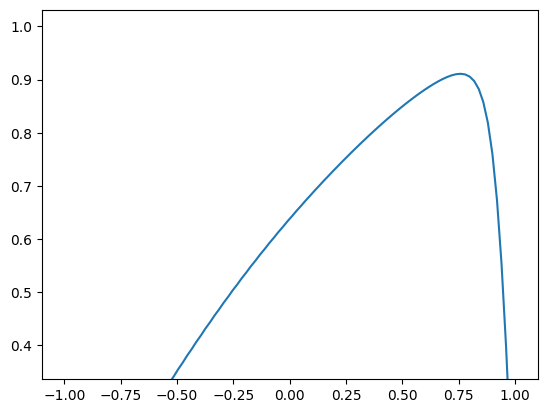

In [4]:
# randbetingelse på venstre side
def fa(x):
    return 0

# randbetingelse på høyre side
def fb(x):
    return 0

u = np.zeros((n,m))

# initialverdien
u[0,:] = np.exp(-(x**2))

for i in np.arange(1,n):
    u[i,:] = lf(f, fa, fb, u[i-1,:],h,k,t[i])
    
fig, ax = plt.subplots()

line, = ax.plot(x, u[0,:])

def animate(i):
    line.set_ydata(u[i,:])
    return line,

ani = animation.FuncAnimation(fig, animate, interval=20, blit=True, save_count=t.size)


from IPython.display import HTML
HTML(ani.to_jshtml())


Den eksakte løsningen utvikler en hopp, som vi kaller for en **sjokk**. Den er assosiert med fenomenet av at karakteristikker krysser hverandre.

Men hva er egentlig den eksakte løsningen? La oss se på nytt på de to eksemplene fra 5_2, hvor vi har tegnet karakteristikkene. Vi tok initialverdiene

**Sjokk**
$$
g(x) = \left\{
\begin{array}{c}
0 \quad & x\leq 0 \\
-1 \quad & x>0
\end{array}
\right.
$$

og 

**Fortynningsbølge**
$$
g(x) = \left\{
\begin{array}{c}
-1 \quad & x\leq 0 \\
0 \quad & x>0
\end{array}
\right.
$$

### b) En sjokk i fart

Vi løser den første situasjon med Lax-Friedrichs metode.

Sofistikerte analytiske metoder sier at løsning skal være at hoppet flytter til høyre med konstant hastighet. Det er imidlertidig ikke noe som man får ut av ligningen alene, man må legge til ekstra fysiske antagelser, typisk i form av såkalte *entropibetingelser*. 

Heldigvis ser det ut som at vår metode har gitt noe rimelig.

Legg merke til at den numeriske metoden ikke gir et rent hopp, men heller en glatt overgang. Det tilsvarer oppførselen til den eksakte løsningen av ligningen

$$
u_x + u u_x = \epsilon u_{xx},
$$

for en liten, men ikke null $\epsilon$ (vi kaller det for numerisk viskositet). Det forklarer hvorfor vi sa $\epsilon\rightarrow 0$ og ikke $\epsilon = 0$ i innledningen. Den grenseverdien kan brukes som et alternativ til entropibetingelser for å definere hva løsningen skal være under sjokk. Det finnes mye litteratur om slike *viskositetsløsninger*.

**Den gode nyheter**: entropiløsninger og viskositetsløsninger er vanskelige, men beskjeden er at vi kan stort sett gi blaffen i det og stole på at numeriske metoder gir oss det vi ønsker.

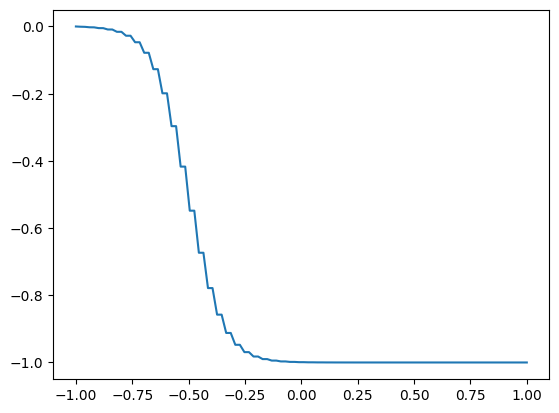

In [5]:
# randbetingelser på venstre side
def fa(x):
    return 0

# randbetingelser på høyre side
def fb(x):
    return -1

u = np.zeros((n,m))

# initialverdien
u[0,:] = -1+0.5*(1-np.sign(x))

for i in np.arange(1,n):
    u[i,:] = lf(f, fa, fb, u[i-1,:],h,k,t[i])
    
fig, ax = plt.subplots()

line, = ax.plot(x, u[0,:])

def animate(i):
    line.set_ydata(u[i,:])
    return line,

ani = animation.FuncAnimation(fig, animate, interval=20, blit=True, save_count=t.size)

HTML(ani.to_jshtml())

### c) Fortynningsbølge

En annen viktig type oppførsel skjer når karaktarestikkene går fra hverandre. Vi kan se det ved å la $u(x,0)$ være negativ for $u<0$ og positiv for $u>0$. Det er en fortynningsbølge eller ekspansjon.

Det samme kommentar gjelder som med sjokk: også her kan vi stole på at de numeriske løsningene er de vi ønsker oss.

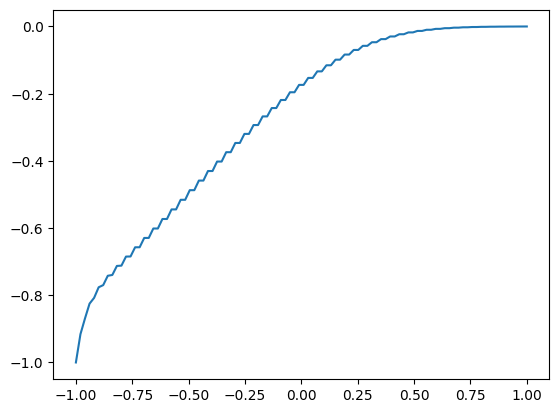

In [6]:
# randbetingelse på venstre side
def fa(x):
    return -1

# randbetingelse på høyre side
def fb(x):
    return 0

# initialverdien
u[0,:] = -0.5*(1-np.sign(x))

for i in np.arange(1,n):
    u[i,:] = lf(f, fa, fb, u[i-1,:],h,k,t[i])
    
fig, ax = plt.subplots()

line, = ax.plot(x, u[0,:])

def animate(i):
    line.set_ydata(u[i,:])
    return line,

ani = animation.FuncAnimation(fig, animate, interval=20, blit=True, save_count=t.size)

HTML(ani.to_jshtml())